# IMPORTS

In [2]:
import os
import pandas as pd
import sys
import json
import matplotlib.pyplot as plt
from collections import defaultdict

from top2vec import Top2Vec

# INPUTS and OUTPUTS

In [3]:
# ------ #
# PARAMS #
# ------ #
threshold = 2759

# ------ #
# INPUTS #
# ------ #
with open('../config/repository_path.txt', 'r') as reader:
    repository_path = reader.read()

sys.path.append(repository_path)

periods = pd.read_csv(os.path.join(repository_path, 'data', 'periods.csv'))

predictions_path = os.path.join(repository_path, 'data', 'predictions')

labeled_data_file = os.path.join(repository_path, 'data', 'labeled_data_2023-06-21.csv')
assert os.path.exists(predictions_path) and os.path.isfile(labeled_data_file)

# ------- #
# OUTPUTS #
# ------- #
suggestions_file = os.path.join(repository_path, 'data', f'suggestions_n={threshold}.csv')


output_topic_file = os.path.join(repository_path, 'data', 'suggestions_with_topics.json')
output_df_file = os.path.join(repository_path, 'data', 'topics_sheet.csv')

top2vec_model_file = os.path.join(repository_path, 'data', 'deep_model.noextension')

# LOCAL IMPORTS

In [3]:
from lib import tdmstudio

# FROM LABELED SELECT RELEVANT

In [4]:
# ------- #
# Labeled #
# ------- #
labeled = pd.read_csv(labeled_data_file)
relevant = labeled[labeled['label']=='R']
print(labeled.shape)
print(labeled.shape)
relevant.insert(loc=relevant.shape[1], column='score', value= [1]*relevant.shape[0])
relevant

(278, 2)
(278, 2)


,id,label,score
0,1288730434,R,1
1,2121470325,R,1
3,2122191647,R,1
5,1942851684,R,1
6,1125693800,R,1
...,...,...,...
170,1325630351,R,1
181,1137347740,R,1
194,1354485059,R,1
202,1325715485,R,1


# FROM PREDICTION FILES SELECT SUGGESTIONS

In [5]:

# ----------- #
# Suggestions #
# ----------- #
# get relevant filenames
filenames = os.listdir(predictions_path)
filenames.remove('item_representation_50k_final.csv')
filenames.remove('item_representation_50k.pic.csv')

# prepend folder and path
files = list(map(lambda file_: os.path.join(repository_path, 'data', 'predictions',file_ ), filenames))
assert all([os.path.isfile(file_) for file_ in files])

# retrieve all data from disk
df = pd.concat(map(lambda file_: pd.read_csv(file_), files))

# sort by score, more relevant first
df = df.sort_values(by='score', ascending=False)

# cut on threshold
suggestions = df.iloc[:threshold]

suggestions

,id,label,score
35731,2610146759,R,0.750947
858,1143646857,R,0.668956
558973,1241441332,R,0.663298
13665,1125784644,R,0.653163
14774,1151111154,R,0.650276
...,...,...,...
251150,1125778135,R,0.355889
638583,1151473701,R,0.355820
1266535,2273228479,R,0.355700
41330,1151614068,R,0.355647


# COMBINE DATA AND RETRIEVE FULL TEXT

In [6]:
all_data = pd.concat([relevant, suggestions])
all_data['text'] = list(map(lambda id_: tdmstudio.get_title_and_text(tdmstudio.get_filename(str(id_))), all_data['id']))
all_data['relevant_or_suggested'] = ['rel']*relevant.shape[0] + ['sugg']*suggestions.shape[0]
all_data.head()
all_data

,id,label,score,text,relevant_or_suggested
0,1288730434,R,1.000000,Refugees Could Be Valuable Assets.\n ...,rel
1,2121470325,R,1.000000,Changing the temporary mindset of refugees.\n ...,rel
3,2122191647,R,1.000000,Refugee crisis.\n \n \n\n ...,rel
5,1942851684,R,1.000000,Our world is not awash in refugees: Open the g...,rel
6,1125693800,R,1.000000,Time for a fresh look at the state of refuge.\...,rel
...,...,...,...,...,...
251150,1125778135,R,0.355889,Who's fanning what?.\n \n ...,sugg
638583,1151473701,R,0.355820,"2,600 foreigners landed in 7 months minus righ...",sugg
1266535,2273228479,R,0.355700,Table of Contents 7 -- No Title.\n \n...,sugg
41330,1151614068,R,0.355647,RCMP's questioning of detainees draws ire.\n ...,sugg


# RETRIEVE DATE AND PERIOD DATA

In [7]:
titles = list(map(tdmstudio.get_title, map(tdmstudio.get_filename, all_data['id'].astype('str'))))
dates =  list(map(tdmstudio.get_date, map(tdmstudio.get_filename, all_data['id'].astype('str'))))
years = [date.split('-')[0] for date in dates]
# texts = list(map(tdmstudio.get_title_and_text, map(tdmstudio.get_filename, suggestions['id'].astype('str'))))

def year2period(year:int):
    for ix, (start,end) in enumerate(zip(periods['start'],periods['end'],)):
        if int(start)<=year and year<=int(end):
            return ix
    assert False

all_data.insert(loc=all_data.shape[1], column='date', value= dates)
all_data.insert(loc=all_data.shape[1], column='year', value= years)
all_data.insert(loc=all_data.shape[1], column='period', value= [year2period(int(year)) for year in years])
all_data.insert(loc=all_data.shape[1], column='title', value= titles)
# suggestions.insert(loc=suggestions.shape[1], column='title and text', value= texts)

all_data

,id,label,score,text,relevant_or_suggested,date,year,period,title
0,1288730434,R,1.000000,Refugees Could Be Valuable Assets.\n ...,rel,1959-12-18,1959,5,Refugees Could Be Valuable Assets.
1,2121470325,R,1.000000,Changing the temporary mindset of refugees.\n ...,rel,2015-09-26,2015,8,Changing the temporary mindset of refugees.
3,2122191647,R,1.000000,Refugee crisis.\n \n \n\n ...,rel,2015-08-29,2015,8,Refugee crisis.
5,1942851684,R,1.000000,Our world is not awash in refugees: Open the g...,rel,2014-11-01,2014,8,Our world is not awash in refugees: Open the g...
6,1125693800,R,1.000000,Time for a fresh look at the state of refuge.\...,rel,2001-09-04,2001,7,Time for a fresh look at the state of refuge.
...,...,...,...,...,...,...,...,...,...
251150,1125778135,R,0.355889,Who's fanning what?.\n \n ...,sugg,2001-10-26,2001,7,Who's fanning what?.
638583,1151473701,R,0.355820,"2,600 foreigners landed in 7 months minus righ...",sugg,1986-09-05,1986,7,"2,600 foreigners landed in 7 months minus righ..."
1266535,2273228479,R,0.355700,Table of Contents 7 -- No Title.\n \n...,sugg,2016-09-14,2016,8,Table of Contents 7 -- No Title.
41330,1151614068,R,0.355647,RCMP's questioning of detainees draws ire.\n ...,sugg,1985-02-20,1985,7,RCMP's questioning of detainees draws ire.


# Histogram --- Articles per period

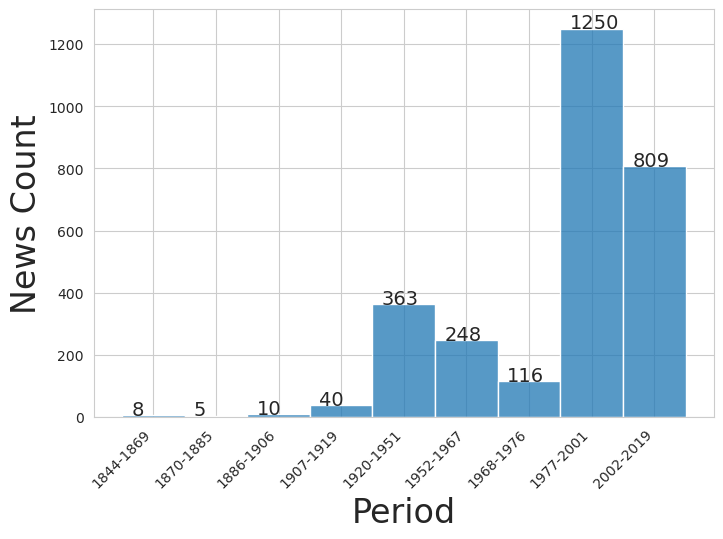

In [169]:

fig, ax = plt.subplots(1, figsize=(8,6))

ix2period = {ix : f"{row['start']}-{row['end']}" for ix, row in periods.iterrows()}



periods_data = list(map(lambda period_ix: ix2period[period_ix], all_data['period']))
periods_data = sorted(periods_data)
sns.histplot(periods_data, bins=[0,1,2,3,4,5,6,7,8],ax=ax)


fig.autofmt_xdate(rotation=45)
ax.set_xlabel('Period', fontsize=24)
ax.set_ylabel('News Count', fontsize=24)
             
freq = defaultdict(int)
for elem in periods_data:
    freq[elem]+=1 
for ix,period in enumerate(sorted(freq)):
    ax.text(ix-0.35,freq[period],f'{freq[period]}', fontsize=14)
    

# ApplyingTop2vec

In [ ]:
if os.path.isfile(top2vec_model_file):
    deep_model = Top2Vec.load(top2vec_model_file)
else:
    print('Start training')
    deep_model = Top2Vec(documents=list(all_data['text']), speed='deep-learn', workers=1)
    print('End training')
    deep_model.save(top2vec_model_file)

2023-07-12 21:38:56,100 - top2vec - INFO - Pre-processing documents for training


Start training


2023-07-12 21:38:59,368 - top2vec - INFO - Creating joint document/word embedding


In [ ]:
topic_sizes, topic_nums = deep_model.get_topic_sizes()
topic_words, word_scores, topic_nums = deep_model.get_topics()
print(topic_sizes)
print(len(topic_sizes))

# Append result of Topic Modelling to DataFrame

In [5]:
# Append top2vec results to dataframe
all_data.insert(loc=all_data.shape[1], column='top2vec', value= deep_model.doc_top)
all_data.insert(loc=all_data.shape[1], column='doc_dist', value= deep_model.doc_dist)

all_data[['id','score', 'date', 'period', 'doc_dist', 'title',  'top2vec']].to_csv(suggestions_file, index=False)

NameError: name 'all_data' is not defined

# Creating `JSON` with all word and document data

In [ ]:
#################
# CREATING JSON #
#################
words_data = {'word': [],
              'score': [],
              'topic': [],
             }

for topic_no in range(topic_words.shape[0]):
    for word_no in range(topic_words.shape[1]):
        words_data['topic'].append(topic_no)
        words_data['word'].append(topic_words[topic_no, word_no])
        words_data['score'].append(float(word_scores[topic_no, word_no]))
# words_df = pd.DataFrame(words_data)



document_data = {'id':list(all_data['id']),
                 'score':list(all_data['score']),
                 'top2vec':list(all_data['top2vec']),
                 'doc_dist':list(all_data['doc_dist']),
                }

combined_data = {'word data': words_data,
                 'document data': document_data}

# ################
# # DUMPING JSON #
# ################
json_object = json.dumps(combined_data, indent=4)
with open(output_topic_file, "w") as outfile:
    outfile.write(json_object)

In [ ]:



## EVERYTHING ABOVE IS OLD
data = {'topic no.': [], 
        'size': [], 
        'relevant count': [], 
        'example': [], 
        'example(rel)':[], 
        'suggestions':[], 
        'relevants':[],
        'all ids':[],
        'suggestions (by relevance)': [],
       }
topic_sizes, topic_nums = deep_model.get_topic_sizes()
topic_words, word_scores, topic_nums = deep_model.get_topics()
for word_ix,_ in enumerate(topic_words[0]):
    data[f'word_{word_ix:03}']=[]

# all_data['top2vec']=deep_model.doc_top
# all_data['doc_dist']=deep_model.doc_dist

for ix in range(len(topic_nums)):
    # Topic number & size 
    data['topic no.'].append(topic_nums[ix])
    data['size'].append(topic_sizes[ix])
    
    # auxdf
    auxdf=all_data[all_data['top2vec']==topic_nums[ix]]
    
    # Example highly relevant to topic
    data['example'].append('https://proquest.com/docview/'+str(auxdf.sort_values(by='doc_dist',ascending=False)['id'].iloc[0]))
    
    # Suggestions IDs (sorted by topic)
    print(auxdf.columns)
    suggestions_ids=auxdf[auxdf['relevant_or_suggested']=='sugg'].sort_values(by='doc_dist',ascending=False)['id']
    data['suggestions'].append(';'.join([str(elem) for elem in suggestions_ids]))
    
    # ALL IDs (sorted by topic)
    all_ids=auxdf.sort_values(by='doc_dist',ascending=False)['id']
    data['all ids'].append(';'.join([str(elem) for elem in all_ids]))
    
    # Suggestions IDs (by relevance)
    #NOT USED BECAUSE WE CANNOT RE RUN THIS SCRIPT, gives different topics 
    # and Serperi is already working with the other topics:
    # FOR THIS EXPERIMENTS WE CAN DO IT, WE COULDN'T FOR THE PREVIOUS ONE. THE ABOVE COMMENT IS COPY PASTED FROM OTHER
    # JUPYTER NOTEBOOK
    
    suggestions_ids=auxdf[auxdf['relevant_or_suggested']=='sugg'].sort_values(by='score',ascending=False)['id']
    data['suggestions (by relevance)'].append(';'.join([str(elem) for elem in suggestions_ids]))
    
    # Labelled as relevant IDs
    relevant_ids=auxdf[auxdf['relevant_or_suggested']=='rel'].sort_values(by='doc_dist',ascending=False)['id']
    data['relevants'].append(';'.join([str(elem) for elem in relevant_ids]))
    
    
    # Filter auxdf to have only relevant (not suggestions)
    auxdf=auxdf[auxdf['relevant_or_suggested']=='rel']
    
    # Relevant example highly relevant to topic.
    if auxdf.shape[0]>0:
        data['example(rel)'].append('https://proquest.com/docview/'+str(auxdf.sort_values(by='doc_dist',ascending=False)['id'].iloc[0]))
    else:
        data['example(rel)'].append('')
        
    # No. of relevant in topic
    data['relevant count'].append(auxdf.shape[0])
    
    # Words in topic
    for word_ix,word in enumerate(topic_words[ix]):
        data[f'word_{word_ix:03}'].append(word)

output_df = pd.DataFrame(data)
output_df.to_csv(output_df_file, index=False)
output_df

# Topic vs period

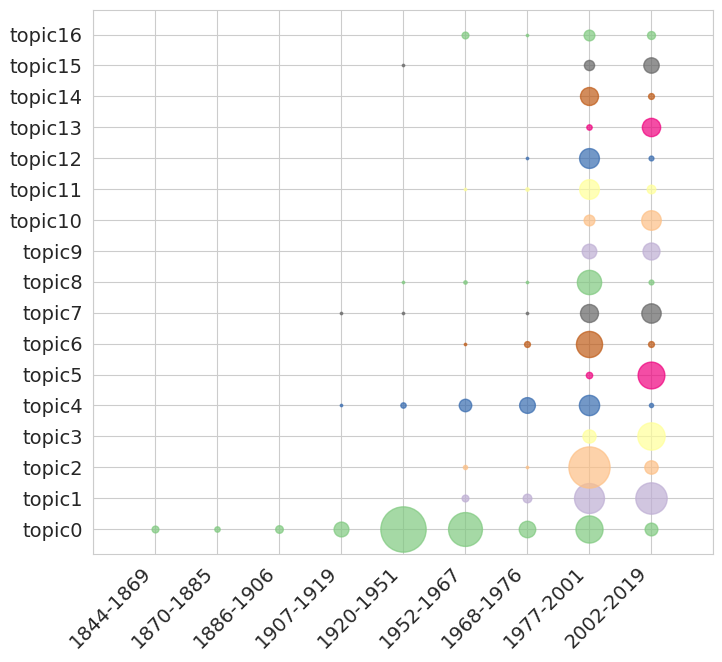

In [237]:
import seaborn as sns
sns.set_style('whitegrid')
fig, ax = plt.subplots(1, figsize=(8,8))

colors = [(127,201,127),
          (190,174,212),
          (253,192,134),
          (255,255,153),
          (56,108,176),
          (240,2,127),
          (191,91,23),
          (102,102,102)
         ]
colors = list(map(lambda color: (color[0]/255.0,color[1]/255.0,color[2]/255.0), colors))

for topic_ix in sorted(set(all_data['top2vec'])):
    auxdf=all_data[all_data['top2vec']==topic_ix]
    x=[]
    y=[]
    for period_ix in sorted(set(auxdf['period'])):
        x.append(period_ix)
        y.append(auxdf[auxdf['period']==period_ix].shape[0])
#     ax[topic_ix].plot(x,y)
#     ax[topic_ix].fill_between(x,y)
        ax.scatter(x=period_ix,
                   y=topic_ix, 
                   s=3*auxdf[auxdf['period']==period_ix].shape[0], 
                   color=colors[topic_ix%len(colors)],
                   alpha=0.7,
                  )

# ax.set_xticklabels()
ax.set_xticks(ax.get_xticks(), labels=['']+[f"{row['start']}-{row['end']}" for _,row in periods.iterrows()]+[''],fontsize=14)
                                            
ax.set_yticks(range(17), labels=[f'topic{topic_ix}' for topic_ix in range(17)] ,fontsize=14)
fig.autofmt_xdate(rotation=45)

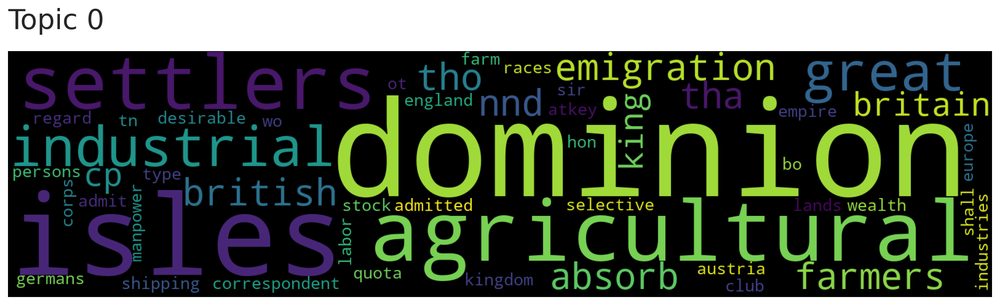

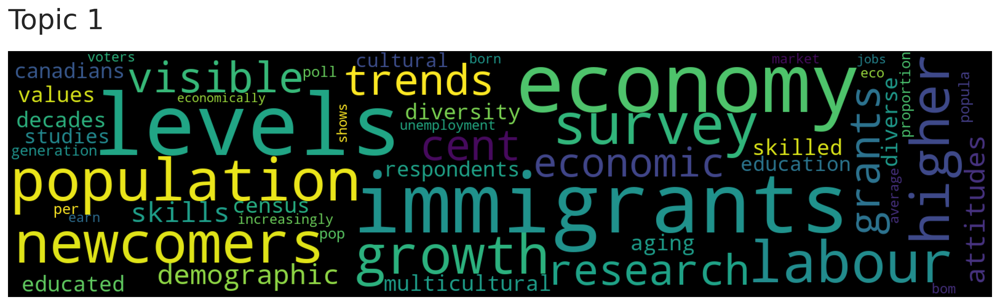

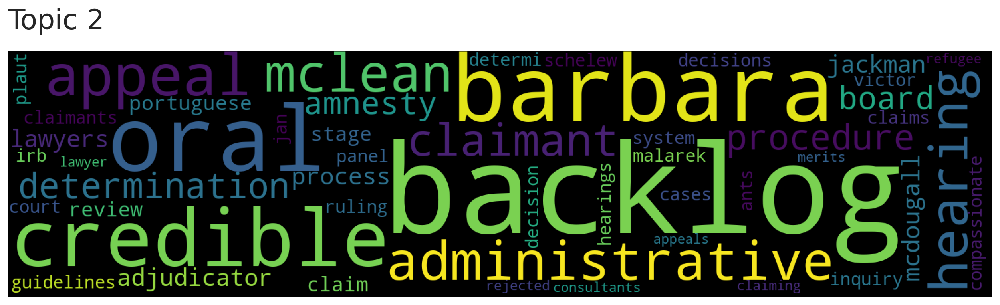

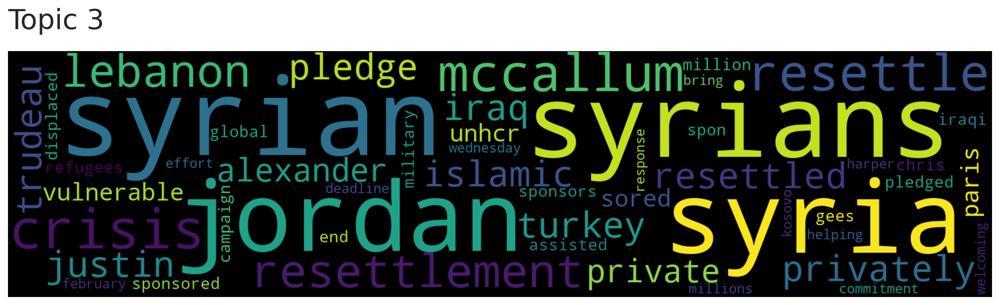

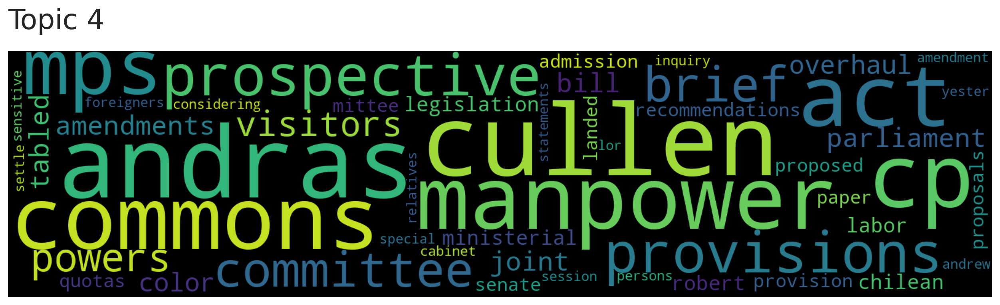

...

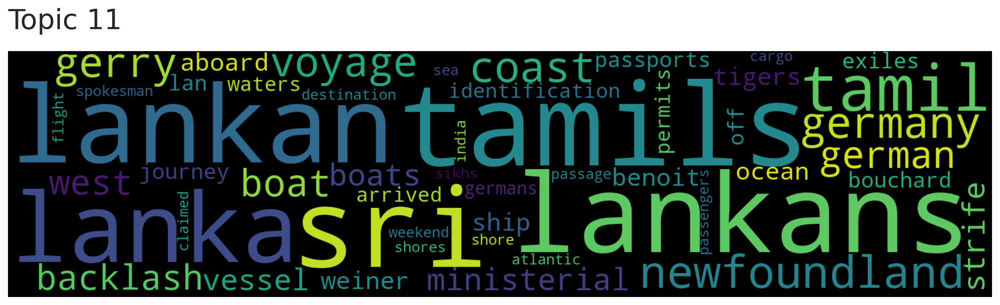

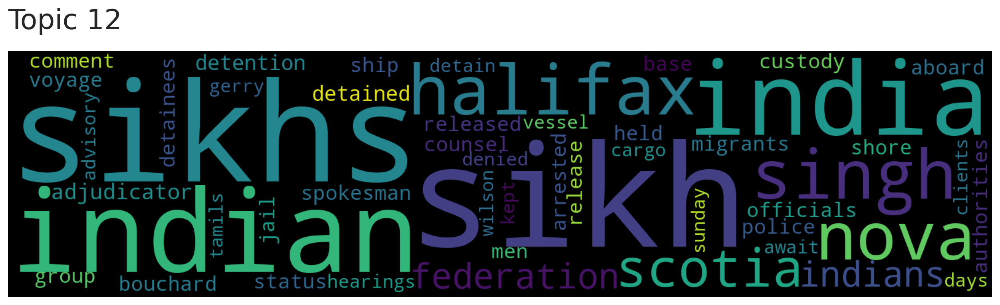

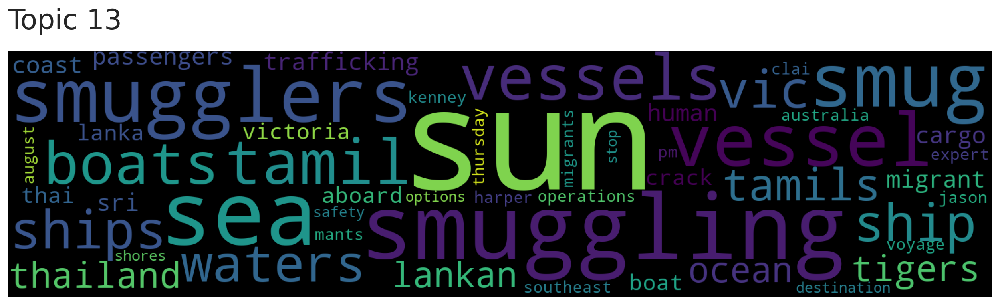

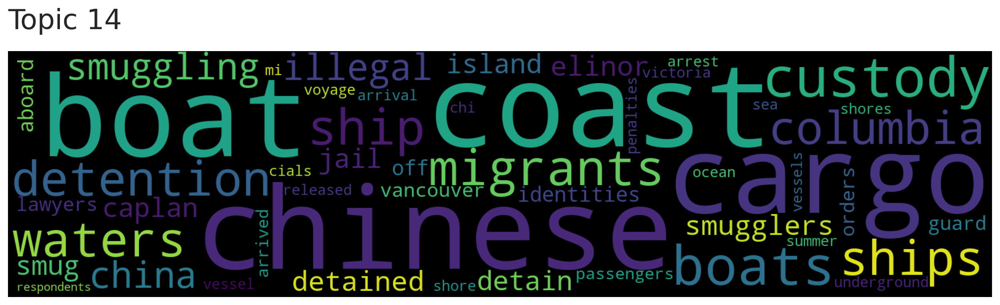

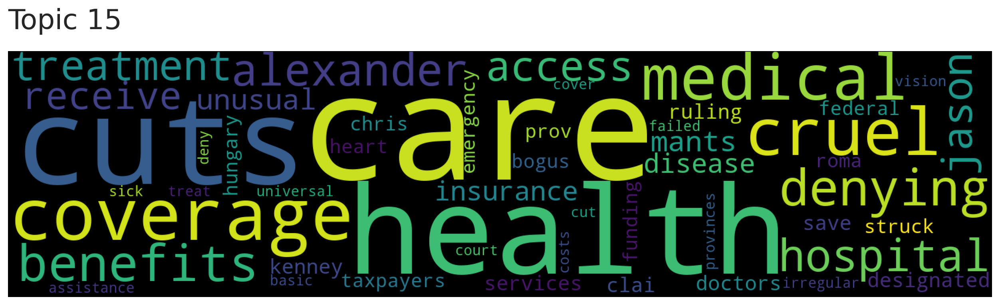

In [59]:
for topic in range(16):
    deep_model.generate_topic_wordcloud(topic)

# Splitting topic 0

In [4]:
labeled_data = pd.read_csv(labeled_data_file)
labeled_data

,id,label
0,1288730434,R
1,2121470325,R
2,1288561405,I
3,2122191647,R
4,2122313077,I
...,...,...
273,1354796300,I
274,1351327583,I
275,1527401195,I
276,1237212790,I


In [108]:
from collections import defaultdict
freq = defaultdict(int)
count=0
for doc in range(len(all_data)):
    sorted_topic_list = deep_model.query_topics(all_data['text'].iloc[doc],num_topics=16)[3]
    freq[sorted_topic_list[0]]+=1
freq

defaultdict(int,
            {0: 700,
             3: 168,
             11: 91,
             1: 372,
             4: 164,
             2: 307,
             8: 113,
             12: 89,
             15: 65,
             6: 132,
             7: 141,
             10: 88,
             9: 98,
             16: 50,
             5: 132,
             14: 76,
             13: 63})

In [120]:
deep_model.top

array([0, 3, 3, ..., 0, 2, 3])

In [101]:
defaultdict(int,
            {0: 692,
             1: 376,
             3: 171,
             11: 85,
             6: 138,
             4: 157,
             2: 304,
             8: 116,
             12: 86,
             15: 65,
             7: 143,
             10: 88,
             14: 82,
             9: 104,
             16: 47,
             5: 131,
             13: 64})

2849

In [100]:
deep_model.topic_sizes

0     816
1     346
2     328
3     159
4     150
5     131
6     131
7     124
8     110
9      87
10     86
11     83
12     73
13     63
14     62
15     60
16     40
dtype: int64

In [99]:
acc=0
for topic_ix in range(1,len(deep_model.topic_sizes)):
    acc+=deep_model.topic_sizes[topic_ix]+freq[topic_ix]
    print(f'topic {topic_ix:2} size = {deep_model.topic_sizes[topic_ix]+freq[topic_ix]:3} ({deep_model.topic_sizes[topic_ix]:6}+{freq[topic_ix]:3})')
acc

topic  1 size = 507 (   346+161)
topic  2 size = 354 (   328+ 26)
topic  3 size = 240 (   159+ 81)
topic  4 size = 266 (   150+116)
topic  5 size = 139 (   131+  8)
topic  6 size = 181 (   131+ 50)
topic  7 size = 150 (   124+ 26)
topic  8 size = 129 (   110+ 19)
topic  9 size =  97 (    87+ 10)
topic 10 size =  93 (    86+  7)
topic 11 size = 119 (    83+ 36)
topic 12 size =  99 (    73+ 26)
topic 13 size =  76 (    63+ 13)
topic 14 size =  98 (    62+ 36)
topic 15 size =  91 (    60+ 31)
topic 16 size =  94 (    40+ 54)


2733

In [98]:
np.sum(deep_model.topic_sizes)

2849